In [ ]:
import nltk
from nltk.corpus import stopwords
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import adjusted_mutual_info_score
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from sklearn.decomposition import TruncatedSVD
from gensim.corpora.dictionary import Dictionary
from nltk import * 
import matplotlib.pyplot as plt
from string import punctuation
import zipfile
import io
import pandas as pd
from google.colab import files
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage import color
from skimage.filters import threshold_otsu
from skimage.restoration import denoise_tv_chambolle
from skimage.segmentation import slic
from skimage.color import label2rgb
from skimage import exposure
from skimage.feature import canny
from nltk.stem import PorterStemmer
import io
import pandas as pd
from google.colab import files
from gensim import corpora
import gensim 
nltk.download('maxent_ne_chunker')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('words')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
uploaded0 = files.upload()
uploaded1 = files.upload()
uploaded2 = files.upload()

Saving 3ccceaae844f34180708cb6cba3441bf.jpg to 3ccceaae844f34180708cb6cba3441bf.jpg


Saving 4e57e21d903b752a6b5aa496a43f1590.jpg to 4e57e21d903b752a6b5aa496a43f1590.jpg


# Analyse

Nous allons extraire les images 



In [ ]:
data = zipfile.ZipFile('Images.zip', 'r')
data.extractall()

Nous allons prendre le data frame fourni et analysons ce qu'il en est.

In [ ]:
df=pd.read_csv('flipkar.csv',encoding="UTF-8")
df=pd.DataFrame.copy(df) 
df.shape

(1050, 15)

(1050, 15)
object     12
float64     2
bool        1
dtype: int64


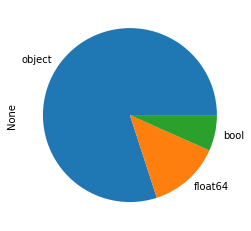

In [ ]:
print(df.shape)
#Renvoie une série contenant le nombre de lignes uniques dans le DataFrame.
print(df.dtypes.value_counts())
#graphe Circulaire d'un colonne donné
df.dtypes.value_counts().plot.pie()
plt.show()

Comme nous pouvons le voir a priori il y énormement de categories differentes ce qui pose probleme car nous souhaitons faire du ML et c'est ce qui peut entraver notre processus

In [ ]:
print(df.product_category_tree.value_counts())
print('')
print('--------------------------------------------')
print('')
print("Nombre de categories differentes " + str(len(df.product_category_tree.unique())))
print('')

["Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars"]                                                                                          56
["Kitchen & Dining >> Coffee Mugs >> Prithish Coffee Mugs"]                                                                                            26
["Watches >> Wrist Watches >> Maxima Wrist Watches"]                                                                                                   23
["Kitchen & Dining >> Coffee Mugs >> Rockmantra Coffee Mugs"]                                                                                          22
["Watches >> Wrist Watches >> Sonata Wrist Watches"]                                                                                                   19
                                                                                                                                                       ..
["Baby Care >> Diapering & Potty Training >> Nappies & Cloth Diapers >> MyKi

Pour eviter le temps de chargement pouvant s'etandre a une heure , j'ai fais un df raccourci qui résume mon travail

In [ ]:
newdf=pd.read_csv('dfnew.csv')
newdf.shape
print(newdf.columns)

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')


# Partie Textes

Voici cependant la maniere dont je m'y suis pris pour traiter le texte :
- Enlever les mots inutiles ( ou , et , donc or , ni , car etc...)
- Savoir categories sont chaque mot ( Verbe ? mot ? adjectif ? etc...)
- Supprimer les chiffres et autres signes de ponctuations

In [ ]:
def cclean_my_data(dfstring,selecter="",selecter2=""):
  stopword=set(stopwords.words('english'))
  word_tokens=word_tokenize(dfstring)
  phrase = [w for w in word_tokens if not w in stopword]
  tagged=nltk.pos_tag(phrase)
  chunk_ne=nltk.ne_chunk(tagged)
  # otherstopword=['buy']
  if selecter !='' : 
    phrase= [ini[0] for ini in tagged if ini[1]==selecter]
    if selecter2!='':
      for ini in tagged :
        if ini[1]==selecter2 :
          phrase.append(ini[0]) 
  otherstopword=['buy','free','product','delivery','best','online',"this", "the", "r","package","content" , "key" , "model", "feature", "key", "size", "pack" ,"for" ,"number", "day" ,'features','sale','type','price','sell','only','cash','specification','guarantee','general','genuine','shipping']
  stopwordpunc=stopword.union(set(punctuation))
  phrase = [w.lower() for w in phrase if not w in stopwordpunc]
  phrase=[w for w in phrase if w.isalpha()]
  lemmatizer=WordNetLemmatizer()
  language=[]
  for word in phrase :
    language.append(lemmatizer.lemmatize(word.lower()))
  searchin=re.compile(r'\W[a-zA-Z0-9][a-zA-Z0-9]?[0-9]?\W')
  searchch=searchin.finditer(' '.join((phrase)))
  lilstopword=[]
  for search in searchch :
   lilstopword.append(search.group().strip())
  phrase1=[word for word in language if not word in lilstopword]
  phrase1=[word for word in phrase1 if not word in otherstopword]
  searchch=searchin.finditer(' '.join((phrase1)))
  lilstopword1=[]
  for search in searchch :
   lilstopword1.append(search.group().strip())
  phrase2=[word for word in phrase1 if not word in lilstopword1]
  phrase2=[word for word in phrase2 if not word in otherstopword]
  
  return ' '.join(set(phrase2))

Stemming permet d'avoir la racine du mot

In [ ]:
porter = PorterStemmer()
print(porter.stem("trouble"))
print(porter.stem("troubling"))
print(porter.stem("troubled"))

troubl
troubl
troubl


In [ ]:
from skimage.transform import resize
newdf=pd.DataFrame.copy(df.sample(700))
a=0
def imageprocess(x):
  global a
  a+=1
  print(a)
  try:
    height=500
    width=500
    img = plt.imread("Images/"+x)  
    img_nb=color.rgb2gray(img)
    threshold=threshold_otsu(img_nb)
    binary_where = np.where(img_nb > threshold, 255, 0)
    resizedimage=resize(binary_where,(height,width),anti_aliasing=True).flatten()
    arSized=np.array(resizedimage) 
  except IOError:
       resizedimage=None
       print('Image=',resizedimage)
  return resizedimage

newdf['imageBin']=newdf['image'].apply(lambda x : imageprocess(x))

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:2800: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


631
632
633
634
635
636
637
638
639
640
641
642
643
644
645
646
647
648
649
650
651
652
653
654
655
656
657
658
659
660
661
662
663
664
665
666
667
668
669
670
671
672
673
674
675
676
677
678
679
680
681
682
683
684
685
686
687
688
689
690
691
692
693
694
695
696
697
698
699
700


Bag of word
nuage de mots
vectoriation 
PCA categorisation 


In [ ]:
def splitthem (dfa) :
  b=dfa.split(" >> ")[0]
  b=b.split('"')[1]
  return str(b)
newdf['product_category_tree']=newdf['product_category_tree'].apply( lambda x : splitthem (x) )

In [ ]:
newdf['Bow']=df['description'].apply(lambda x : cclean_my_data(x))
newdf['BowNum']=df['description'].apply(lambda x : cclean_my_data(x,'NN'))
newdf['BowAdj']=df['description'].apply(lambda x : cclean_my_data(x,'JJ'))
df['BowNumAdj']=df['description'].apply(lambda x : cclean_my_data(x,'NN','JJ'))


In [ ]:
newdf.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications', 'imageBin', 'Bow',
       'BowNum', 'BowAdj'],
      dtype='object')

In [ ]:
bag=newdf['Bow']
bag1=newdf['BowNum']
bag2=newdf['BowAdj']
bag3=df['BowNumAdj']

 On tente de savoir de quoi parle le texte grace aux mots clefs du texte

In [ ]:
appa=[]
for i in range(len(bag3)):
  listlist=bag3[i].split()
  appa.append(listlist)
dic=corpora.Dictionary(appa)
doc_term=[dic.doc2bow(rev) for rev in appa]

In [ ]:
LDA=gensim.models.ldamodel.LdaModel
lda_model= LDA(corpus=doc_term,id2word=corpora.Dictionary(appa),num_topics=6,random_state=100,chunksize=1000,passes=5,iterations=2000)
print('\nPerplexity: ', lda_model.log_perplexity(doc_term,total_docs=10000))  

from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=appa, dictionary=corpora.Dictionary(appa) , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)
lda_model.print_topics()
lda_model.show_topics(formatted=False)


Perplexity:  -7.052873573347893

Coherence Score:  0.36798400428463024


[(0,
  [('different', 0.025806278),
   ('green', 0.023031157),
   ('paper', 0.021669427),
   ('world', 0.02130262),
   ('way', 0.018216876),
   ('look', 0.017839322),
   ('apply', 0.017588621),
   ('box', 0.015915321),
   ('other', 0.01515033),
   ('damage', 0.01260731)]),
 (1,
  [('good', 0.022085626),
   ('adorable', 0.021538699),
   ('material', 0.018427081),
   ('kitchen', 0.017710468),
   ('natural', 0.017619414),
   ('essential', 0.017191578),
   ('oil', 0.01713343),
   ('famous', 0.017115641),
   ('sure', 0.016874723),
   ('relaxation', 0.016048098)]),
 (2,
  [('design', 0.054376695),
   ('u', 0.034956638),
   ('fabric', 0.02330501),
   ('high', 0.022299683),
   ('soft', 0.021192258),
   ('quality', 0.02086312),
   ('comfort', 0.019395085),
   ('complete', 0.019017505),
   ('positive', 0.017562155),
   ('available', 0.015966333)]),
 (3,
  [('great', 0.049479894),
   ('place', 0.016893333),
   ('life', 0.014509148),
   ('cold', 0.013876113),
   ('experience', 0.013870633),
   ('p

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

On verifie le score de coherence et ensuite on voit le graphique du poids de chaque mot theme

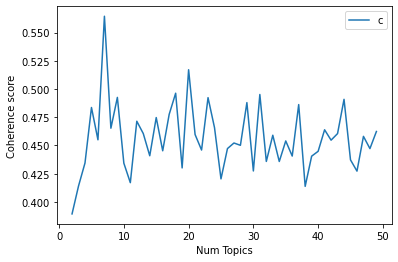

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=corpora.Dictionary(appa), corpus=doc_term, texts=appa, start=2, limit=50, step=1)
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [ ]:
!pip3 install opencv-python
!pip install pyLDAvis

     |████████████████████████████████| 1.7MB 5.4MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 9.9MB 15.0MB/s 
     |████████████████████████████████| 15.3MB 170kB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-cp37-none-any.whl size=136870 sha256=b5171e05e59659d13c80a804e6b9c3b81fc6245eee4c4a4973e1f2e46776286d
  Stored in directory: /root/.cache/pip/wheels/a0/9c/fc/c6e00689d35c82cf96a8adc70edfe7ba7904374fdac3240ac2
Successfully built pyLDAvis
ERROR: tensorflow 2.5.0 has requirement numpy~=1.19.2, but you'll have numpy 1.20.3 which is incompatible.
ERROR: google-colab 1.0.0 has requirement pandas~=1.1.0; python_version >= "3.0", but you'll have pandas 1.2.4 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis= gensimvis.prepare(lda_model,doc_term,corpora.Dictionary(appa))
vis

ModuleNotFoundError: ignored

Maintenant on fais un modele de Machine Learning dans le but de voir si les categories sont bien identifiables seulement par rapport aux categories sans lui suggerer

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, f1_score, precision_score
CV=CountVectorizer(stop_words='english')
X_train,X_test,y_train,y_test = train_test_split(bag,newdf['product_category_tree'],test_size = 0.2,random_state = 0)
count_train =CV.fit_transform(X_train.values)
count_test =CV.transform(X_test.values)
bagBrag=CV.fit_transform(bag.values)
modelMul = MultinomialNB()
modelMul.fit(count_train,y_train)
y_pred_text = modelMul.predict(count_test)
print(accuracy_score(y_test,y_pred_text))

0.9142857142857143


Nous allons reduire les dimensions de notre dataframe

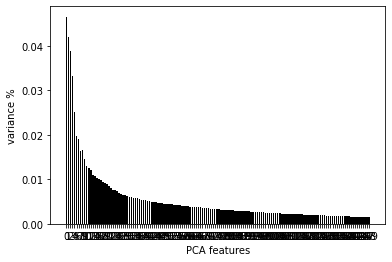

In [ ]:
pca=TruncatedSVD(n_components=150)
pca_data=pca.fit_transform(count_test)
pca_data2=pca.fit_transform(count_train)
pca_data_text=pca.fit_transform(bagBrag)
features = range(len(pca.components_))
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
plt.show()

In [ ]:
def showmeMyCoude(pca_data1):
  inertia = []
  K_range = range(1,20)
  for k in K_range:
    model=KMeans(n_clusters=k).fit(pca_data1)
    inertia.append(model.inertia_)
  plt.plot(K_range,inertia)
  plt.show()

In [ ]:
from nltk.cluster import KMeansClusterer, euclidean_distance
clusterers=KMeansClusterer(7,euclidean_distance)
clusters=clusterers.cluster(pca_data_text,True,trace=True)

k-means trial 0
iteration
iteration
iteration
iteration
iteration


Nous pouvons constater que les clusters categorisent plutot bien dans le sens ou il y a des termes qui sont coherents avec leurs categories et d'autres ou c'est partagé et l'on sent le potentiel avec ce petit echantillon

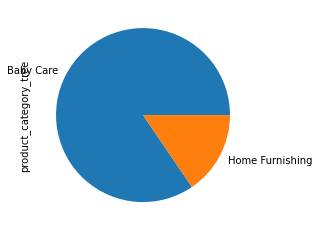

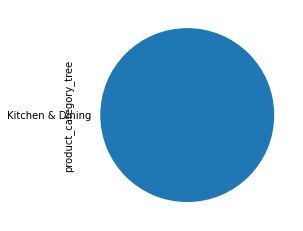

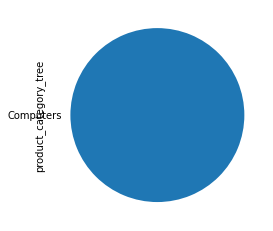

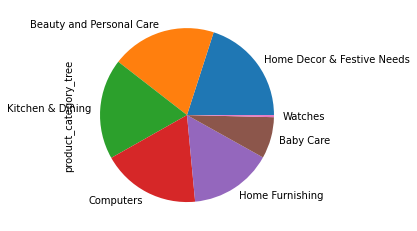

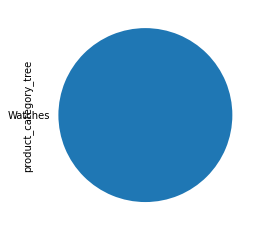

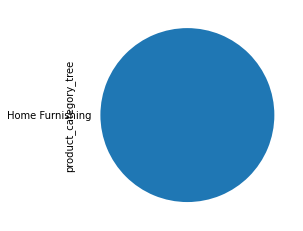

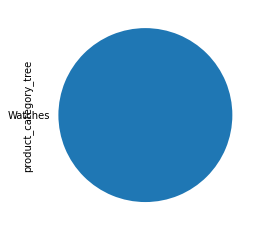

In [ ]:
from seaborn import boxplot
dfAssemblage=pd.DataFrame(clusters,columns=['clusterText'])
df_segmen=pd.concat([newdf.reset_index(drop=True),dfAssemblage],axis=1)
df_segmen.head()
for i in range(7):
  df_segmen[df_segmen['clusterText']==i]['product_category_tree'].value_counts().plot.pie()
  plt.show()


Nous allons voir le score de prediction sur les categories en supervisés

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import  GridSearchCV

steps = [('scaler', StandardScaler()),
         ('paramz', RandomForestClassifier())]
pipeline=Pipeline(steps)
parameters = {'paramz__n_estimators' :np.arange(1,30),'paramz__n_jobs':np.arange(1,30)}
grid=GridSearchCV(pipeline,parameters,cv=5)
grid.fit(pca_data2,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('paramz',
                                        RandomForestClassifier(bootstrap=True,
                                                               ccp_alpha=0.0,
                                                               class_weight=None,
                                                               criterion='gini',
                                                               max_depth=None,
                                                               max_features='auto',
                                                               max_leaf_nodes=None,
                                           

Nous allons maintenant prétraiter les images avant de les traiter dans les reseaux de neuronnes en :
 * Les mettant en noir et blanc
 * En reduisant le nbr de pixel
 * En ne gardant que les contours

In [ ]:
def imageprocess4D(x):
  try :
    height=100
    width=100
    img = plt.imread("Images/"+x)  
    img_nb=color.rgb2gray(img)
    image_canny=canny(img_nb)
    image_eg=exposure.equalize_adapthist(image_canny)
    resizedimage=resize(image_eg,(height,width),anti_aliasing=True)
    arSized=np.array(resizedimage)
  except IOError:
    resizedimage=None;
  return resizedimage

newdf['imageBin4']=newdf['image'].apply(lambda x : imageprocess4D(x))

In [ ]:
categories=newdf['product_category_tree'].unique()
label=newdf['product_category_tree'].values
newdf['product_category_tree']=newdf['product_category_tree'].str.replace('[','')    
bankImage = np.array(newdf['imageBin4'].tolist())

# Partie Image

Nous allons clusteriser les images cette fois et voire ce que l'on en extrait

In [ ]:
X = np.array(newdf['imageBin'].tolist())

In [ ]:
import seaborn as sns
from sklearn.cluster import KMeans
km=KMeans(n_clusters=7)
km.fit(X)
pred=km.predict(X)

Nous voyons que le score est tout aussi interessant

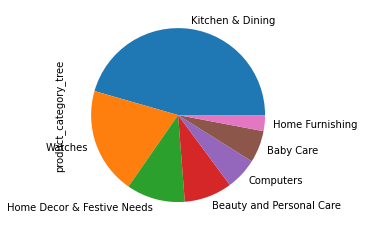

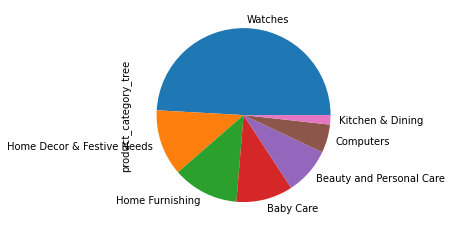

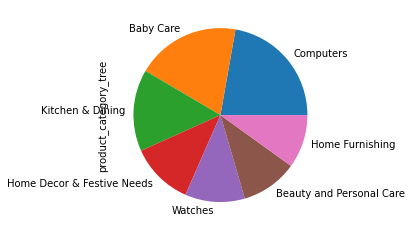

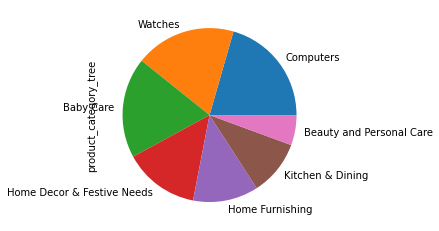

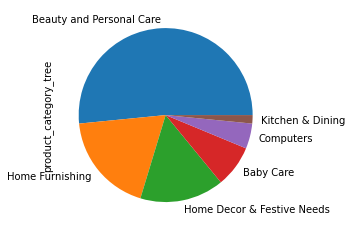

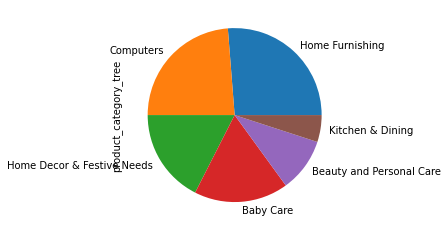

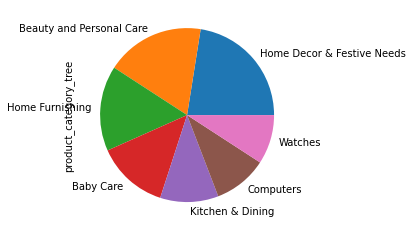

In [ ]:
dfAssemblage=pd.DataFrame(km.labels_,columns=['clusterImage'])
df_segmen=pd.concat([newdf.reset_index(drop=True),dfAssemblage],axis=1)
df_segmen.head()
for i in range(7):
  df_segmen[df_segmen['clusterImage']==i]['product_category_tree'].value_counts().plot.pie()
  plt.show()

Nous allons faire un reseau de neuronnes sur les images pour savoir si il y a possibilité

In [ ]:
dff=pd.get_dummies(newdf['product_category_tree'])
target=dff.values

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import np_utils
from keras.callbacks import EarlyStopping

model=Sequential()
X_train,X_test,y_train,y_test = train_test_split(X,target ,test_size = 0.2,random_state = 0)
model.add(Dense(50, activation='relu',input_shape=(250000,)))
model.add(Dense(50,activation='relu'))
model.add(Dense(len(categories),activation='softmax'))
es = EarlyStopping(monitor='val_loss') # permet d'arreter quand il y a convergence, quand le modele converge
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy']) #optimisation de la fonction cout
model.fit(X_train,target,validation_split=0.2,epochs=30,callbacks=[es]) #epoch permet de voir plusieurs fois les images

Epoch 1/30
14/14 [==============================] - 16s 156ms/step - loss: 1.9457 - accuracy: 0.1690 - val_loss: 1.9453 - val_accuracy: 0.1429


In [ ]:
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.callbacks import ModelCheckpoint

modele2=Sequential()
X_train,X_test,y_train,y_test = train_test_split(bankImage.reshape(bankImage.shape[0], 100,100,1),target ,test_size = 0.2,random_state = 0)
modele2.add(Conv2D(100, activation='relu',kernel_size=4,input_shape=[100,100,1],padding='same'))
modele2.add(MaxPooling2D(2))
modele2.add(Dropout(0.25))
modele2.add(Conv2D(50, activation='relu',kernel_size=4,padding='same'))
modele2.add(MaxPooling2D(pool_size=(2, 2)))
modele2.add(Flatten())
modele2.add(Dense(len(categories),activation='softmax'))
es = EarlyStopping(monitor='val_loss')
checkpoint=ModelCheckpoint('weights.hdf5',monitor='val_loss',save_best_only=True )
modele2.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
modele2.fit(X_train,y_train,validation_split=0.2,epochs=30)
modele2.evaluate(X_test,y_test)

Epoch 1/30
14/14 [==============================] - 26s 2s/step - loss: 1.9465 - accuracy: 0.1688 - val_loss: 1.9377 - val_accuracy: 0.1429
Epoch 2/30
14/14 [==============================] - 23s 2s/step - loss: 1.7980 - accuracy: 0.3035 - val_loss: 1.7571 - val_accuracy: 0.3482
Epoch 3/30
14/14 [==============================] - 23s 2s/step - loss: 1.4466 - accuracy: 0.4646 - val_loss: 1.6617 - val_accuracy: 0.4196
Epoch 4/30
14/14 [==============================] - 23s 2s/step - loss: 1.3322 - accuracy: 0.5370 - val_loss: 1.5836 - val_accuracy: 0.4375
Epoch 5/30
14/14 [==============================] - 23s 2s/step - loss: 1.0778 - accuracy: 0.6476 - val_loss: 1.6895 - val_accuracy: 0.4107
Epoch 6/30
14/14 [==============================] - 23s 2s/step - loss: 0.9630 - accuracy: 0.6846 - val_loss: 1.6302 - val_accuracy: 0.4464
Epoch 7/30
14/14 [==============================] - 23s 2s/step - loss: 0.8011 - accuracy: 0.7412 - val_loss: 1.6765 - val_accuracy: 0.4464
Epoch 8/30
14/14 [==

[4.426361083984375, 0.5071428418159485]

In [ ]:
modele2.predict_classes(X_test)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


array([5, 6, 3, 3, 3, 0, 5, 5, 4, 2, 1, 1, 3, 0, 4, 3, 2, 0, 4, 1, 1, 0,
       5, 4, 3, 5, 4, 6, 0, 2, 0, 4, 2, 0, 5, 0, 5, 6, 1, 1, 2, 4, 1, 6,
       5, 6, 2, 2, 4, 5, 4, 2, 5, 2, 2, 2, 1, 1, 0, 6, 2, 3, 5, 5, 4, 5,
       3, 4, 0, 1, 3, 4, 1, 2, 4, 6, 3, 2, 3, 2, 1, 2, 0, 3, 4, 6, 0, 6,
       6, 1, 4, 6, 4, 5, 2, 0, 2, 2, 6, 2, 3, 5, 3, 5, 1, 3, 2, 5, 2, 5,
       1, 6, 0, 0, 6, 5, 5, 0, 6, 5, 3, 5, 1, 1, 4, 6, 6, 3, 5, 3, 0, 5,
       2, 2, 4, 0, 3, 5, 1, 3])

Regardons les predictions en images

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


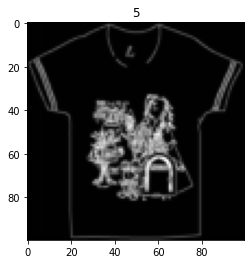

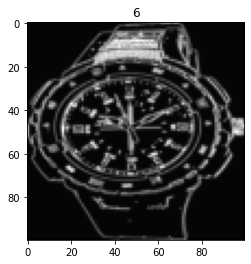

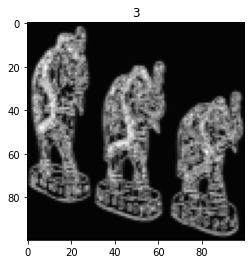

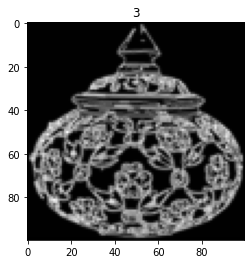

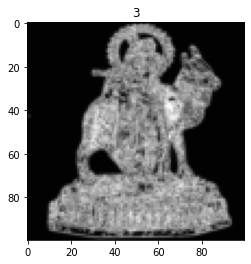

...

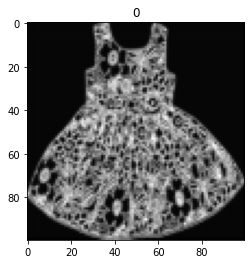

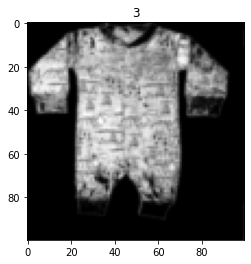

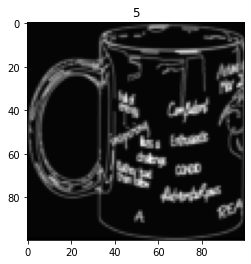

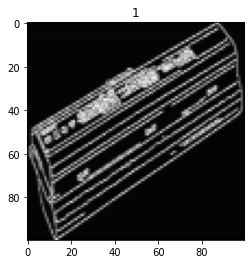

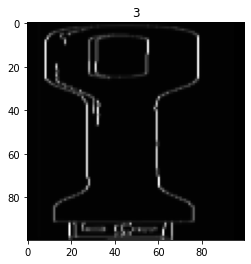

In [ ]:
for i in range (len(X_test)) :
  plt.imshow(X_test[i].reshape(100,100),cmap='gray')
  plt.title(modele2.predict_classes(X_test)[i])
  plt.show()

In [ ]:
dff.columns
dicct={}
a=0
for name in dff.columns:
  dicct[a]=name
  a+=1
list_image = [dicct.get(x, x) for x in modele2.predict_classes(X_test)]
dfensemble=pd.DataFrame((list_image,y_pred_text))
dfensemble=dfensemble.T
dfensemble.columns
dfensemble.head()

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


AttributeError: ignored

                            0                           1
0            Kitchen & Dining                   Baby Care
1                     Watches                     Watches
2  Home Decor & Festive Needs  Home Decor & Festive Needs
3  Home Decor & Festive Needs  Home Decor & Festive Needs
4  Home Decor & Festive Needs  Home Decor & Festive Needs

Nous pouvons voir qu'il y a beaucoup de point commun entre ce que dit les données textuelles vis a vis des categories et les données images

In [ ]:
dfensemble[dfensemble.iloc[:,0]==dfensemble.iloc[:,1]]

AttributeError: ignored

                              0                           1
1                       Watches                     Watches
2    Home Decor & Festive Needs  Home Decor & Festive Needs
3    Home Decor & Festive Needs  Home Decor & Festive Needs
4    Home Decor & Festive Needs  Home Decor & Festive Needs
6              Kitchen & Dining            Kitchen & Dining
..                          ...                         ...
126                     Watches                     Watches
128            Kitchen & Dining            Kitchen & Dining
129  Home Decor & Festive Needs  Home Decor & Festive Needs
135                   Baby Care                   Baby Care
137            Kitchen & Dining            Kitchen & Dining

[71 rows x 2 columns]

In [ ]:
badmatch=dfensemble[dfensemble.iloc[:,0]!=dfensemble.iloc[:,1]]
goodmatch=dfensemble[dfensemble.iloc[:,0]==dfensemble.iloc[:,1]]

Voyons quelles images , ou les types de données sont d'accord, matchs le plus avec la categorie predites

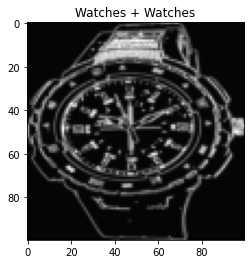

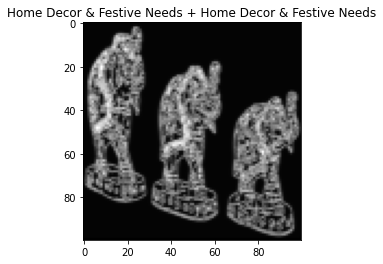

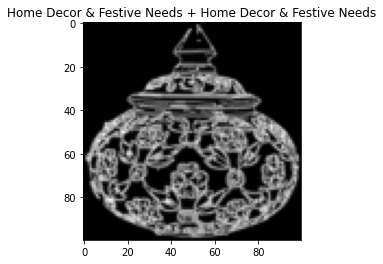

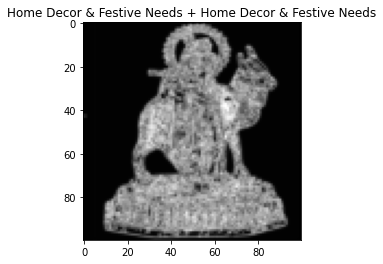

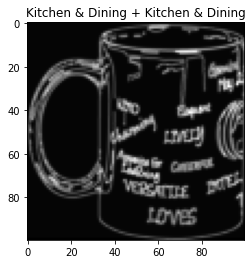

...

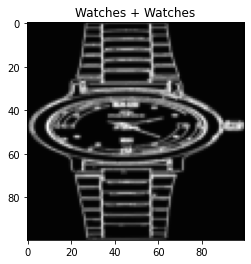

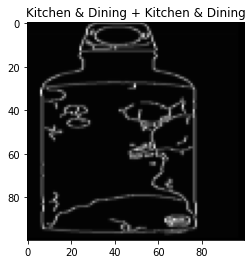

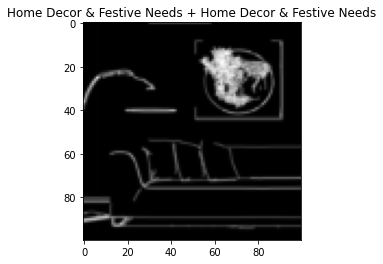

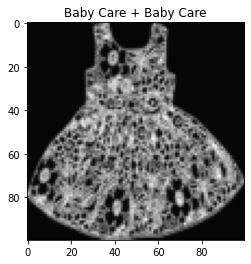

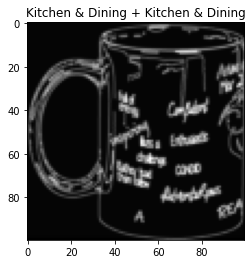

In [ ]:
for i in range(len(goodmatch)):
  plt.imshow(X_test[goodmatch.index[i]].reshape(100,100),cmap='gray')
  plt.title(str(goodmatch.iloc[i,0])+" + " + str(goodmatch.iloc[i,1]))
  plt.show()

# Jointure en clustering

Nous allons joindre les données texte et images et visualiser les clusters pour voir si les categories sont fiables

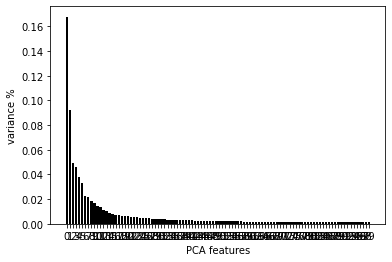

In [ ]:
pca=TruncatedSVD(n_components=100)
pca_data_images=pca.fit_transform(X)
features = range(len(pca.components_))
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
plt.show()

In [ ]:
lste_image=[]
for i in range(len(pca_data_images)):
  lste_image.append(np.hstack((pca_data_images[i],pca_data_text[:700][i])))
PCA_components = pd.DataFrame(lste_image)
PCA_components.shape

(700, 250)

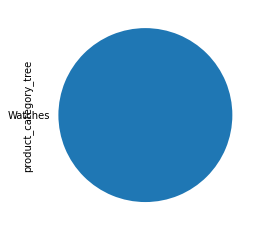

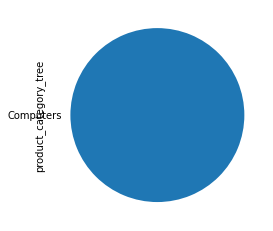

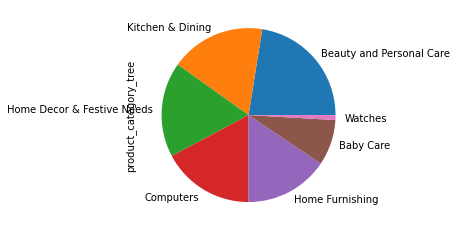

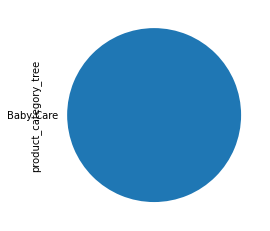

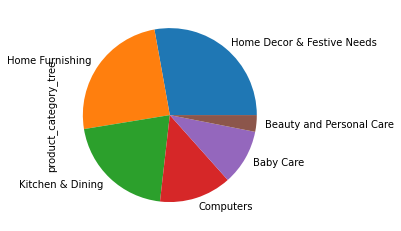

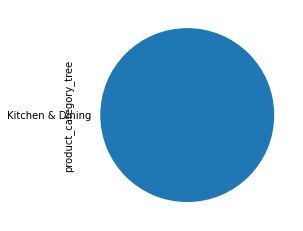

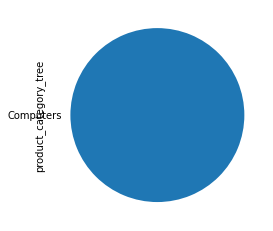

In [ ]:
import seaborn as sns
from sklearn.cluster import KMeans
km=KMeans(n_clusters=7)
km.fit(PCA_components)
pred=km.predict(PCA_components)
dfAssemblage=pd.DataFrame(km.labels_,columns=['clusterImageText'])
df_segmen=pd.concat([newdf.reset_index(drop=True),dfAssemblage],axis=1)
df_segmen.head()
for i in range(7):
  df_segmen[df_segmen['clusterImageText']==i]['product_category_tree'].value_counts().plot.pie()
  plt.show()

Comme nous pouvons le voir le resultat est satisfaisant sachant qu'il y a peu d'images pour chaque categories ( 700/7 =100 images par cat) , que les images sont tres variées ( Cat pc : beaucoup de formes differentes sur chaque photo de la meme categorie ) et se ressemble beaucoup ( vetement enfant vs vetement adultes ) 